# 6-1. 프로젝트: 인물 모드 문제점 찾기

루브릭
아래의 기준을 바탕으로 프로젝트를 평가합니다.

| 평가문항  | 상세기준 |
| :--- | :--- |
| 1. 인물모드 사진을 성공적으로 제작하였다. | 아웃포커싱 효과가 적용된 인물모드 사진과 동물 사진, 배경전환 크로마키사진을 각각 1장 이상 성공적으로 제작하였다. |
| 2. 제작한 인물모드 사진들에서 나타나는 문제점을 정확히 지적하였다. | 인물사진에서 발생한 문제점을 정확히 지적한 사진을 제출하였다. |   
| 3. 인물모드 사진의 문제점을 개선할 수 있는 솔루션을 적절히 제시하였다. | semantic segmentation mask의 오류를 보완할 수 있는 좋은 솔루션을 이유와 함께 제시하였다. |

## 소감

---

평소 사진에 대한 관심이 남달라 매우 흥미로운 프로젝트였습니다. 사진편집에 쓰이는 여러 필터 효과들을 직접 구현하고 적용해 본다는 것이 색다른 경험이었고 재미있었지만 문제점에 대한 해결책을 찾고 적용하는 단계에서 수없이 부딪치는 난제들과 부딪쳐야 했습니다. 특히 코렙과 개인노트북에서의 환경설정 문제는 엄청난 스트레스였습니다.^^ pixellib 의 버전과 텐서플로우와의 버전 문제, BatchNormalization 에 관계된 에러 등. 결국 lms 주피터노트북으로 돌아와 프로젝트를 수행하게 되었지만 현실적으로 앞으로 부딪치게 될 실제적 문제들이었다 생각하며 본 프로젝트에 임하였습니다.

크로마키기법 적용 task는 가장 재미있게 진행한 task였습니다. 해바라기가 있는 꽃병 뒤에서 빼꼼하고 있는 야옹이를 상상하며 작업을 진행하였는데 역시 완성하고 나니 귀염뿜뿜이었습니다.^^ 크기와 위치조절을 하여 꽃병과 어울린 병합이 되도록 배치하였습니다. 

가장 크게 시간과 노력을 들인 작업이 인물모드 사진과 그 문제점을 해결하는 task 였는데 마스크를 따고 블러처리하여 병합하니 각 인물들의 경계선이 뭉글어지는 현상이 발생했고 이를 해결하려는 노력으로 엣지 검출 전 샤프닝 적용, 엣지 검출하기 위해 캐니엣지 적용: cv2.Canny 등등을 시도해 보았고 동일한 블러 매개변수 17로 지정했는데 조금은 개선이 된 듯함. 

그러나 근본적인 해결점을 되지 못한다고 판단하여 다른 접근법을 찾던 중 [MODNet 모델](https://www.linkedin.com/pulse/modnet-remove-background-real-time-demo-code-included-sobh-phd/)을 알게 되어 이를 적용 시도해 보다가 역시 모델 적용에 대한 이해와 지식이 부족한 탓에 한가지 이상한? 효과만 적용해 보는데 그쳤습니다.하지만 다음에 활용해 볼 직한 좋은 모델을 알았다는 것이 이번 프로젝트의 제 나름의 큰 성과라 하겠습니다.

다음은 MODNet 모델에 관한 요약입니다.

[MODNet: Is a Green Screen Really Necessary for Real-Time Portrait Matting?](https://medium.com/ddiddu-log/modnet-is-a-green-screen-really-necessary-for-real-time-portrait-matting-%EB%85%BC%EB%AC%B8%EB%A6%AC%EB%B7%B0-e3eb27898b69) 논문리뷰 제목에 드러난 것처럼 Green Screen 없이 Portrait matting을 하기 위해 제안된 딥러닝 모델로 MODNet은 하나의 RGB 이미지를 입력값로 사용하고, 단일 모델로 실시간 Portrait matting을 수행해 배경을 제거해주는 모델이었습니다. 

이러한 과정은 세 단계로 나누어져 진행되는데 1.Semantic estimation 2.Detail prediction 3.Semantic-detail fusion 이 그것입니다.

Semantic estimation을 통해 거친 전경 마스크(Coarse foreground mask)을 예측하고, 
Detail prediction에서 세밀한 전경의 가장자리를 예측하며 
마지막으로 Semantic-detail fusion 단계는 이름처럼 두 하위 목표의 예측값인 Semantic과 Detail을 합쳐 최종 alpha matte 값을 예측하게 되는 것이라 요약해 볼 있겠습니다.




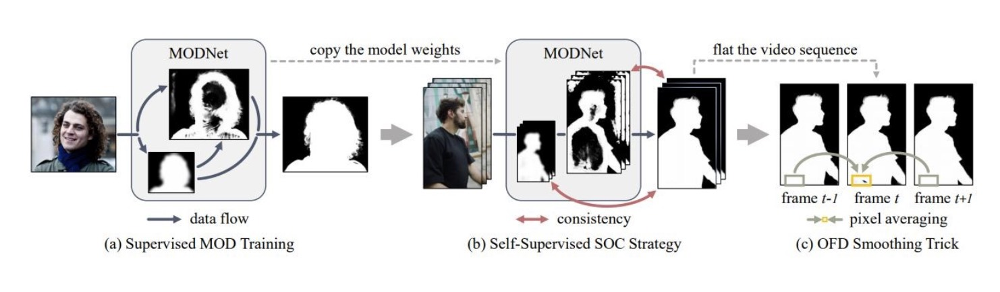

In [168]:
from IPython.display import Image
import os

url = os.getenv('HOME')+'/aiffel/human_segmentation/images/modnet.jpg' 
Image(url)

In [138]:
# os: Operating System의 줄임말로, 운영체제에서 제공되는 여러 기능을 파이썬에서 사용할 수 있도록 함 (Ex. 디렉토리 경로 이동, 시스템 환경 변수 가져오기 등)
# urllib: URL 작업을 위한 여러 모듈을 모은 패키지. (Ex. urllib.request, urllib.parse, ...)
# cv2: OpenCV 라이브러리로, 실시간 컴퓨터 비전을 목적으로 한 프로그래밍 라이브러리
# numpy(NumPy): 행렬이나 대규모 다차원 배열을 쉽게 처리할 수 있도록 지원하는 라이브러리. 데이터 구조 외에도 수치 계산을 위해 효율적으로 구현된 기능을 제공
# pixellib: 이미지 및 비디오 segmentation을 수행하기 위한 라이브러리. 
# pixellib.semantic: segmentation 기법 중, semantic segmentation을 쉽게 사용할 수 있도록 만든 라이브러리
# matplotlib: 파이썬 프로그래밍 언어 및 수학적 확장 NumPy 라이브러리를 활용한 플로팅 라이브러리로, 데이터 시각화 도구
# importlib.metadata: 설치된 패키지 메타 데이터에 대한 접근을 제공하는 라이브러리.
# 해당 코드 블럭에서는 importlib.metadata 안에 있는 version() 함수를 이용하여 pixellib 라이브러리의 버전을 확인

import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt
from importlib.metadata import version

# print(cv2.__version__)
print(version('pixellib'))

import tensorflow as tf
print(tf.__version__)
# from PIL import Image
# print(Image.__version__)

0.7.1
2.6.0


## Step 1. 인물모드 직접 해 보기

여러분의 셀카를 이용해서 오늘 배운 내용을 수행해 봅시다. 아래와 같은 이미지를 얻어야 합니다. 최소 3장 이상의 인물모드 사진을 만들어 봅시다. 인물이 주인공이 아닌, 귀여운 고양이에 대한 아웃포커싱 사진도 만들어 볼 수 있을 것입니다. 시맨틱 세그멘테이션 스텝에서 힌트를 찾아봅시다. 배경을 blur하는 인물모드 사진이 아니라 배경사진을 다른 이미지로 교체하는 크로마키 배경 합성을 시도해 볼 수도 있을 것입니다. 여러분만의 환상적인 사진을 만들어 보면 어떨까요?

## 셸로우 포커스 만들기 (2) 세그멘테이션으로 사람 분리하기

(1034, 1560, 3)
(800, 1280, 3)
(800, 1280, 3)
(853, 1280, 3)


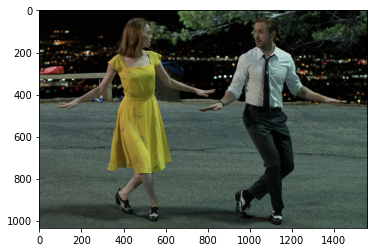

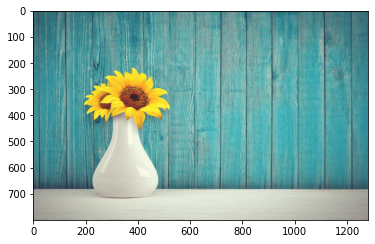

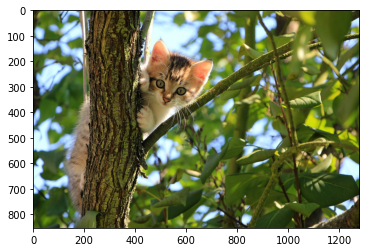

In [169]:
# os 모듈에 있는 getenv() 함수를 이용하여 읽고싶은 파일의 경로를 file_path에 저장
# 준비한 이미지 파일의 경로를 이용하여, 이미지 파일을 읽음
# cv2.imread(경로): 경로에 해당하는 이미지 파일을 읽어서 변수에 저장
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/lala_land.jpg'  
img_orig = cv2.imread(img_path)

img_sunflower_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/sunflower.jpg' 
img_sunflower = cv2.imread(img_sunflower_path) 

img_pets_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/pets.jpg' 
img_pets = cv2.imread(img_pets_path) 

print(img_orig.shape)
print(img_hills.shape)
print(img_sunflower.shape)
print(img_pets.shape)

# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 이미지 색상 채널을 변경 (BGR 형식을 RGB 형식으로 변경)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시, 입력은 RGB(A) 데이터 혹은 2D 스칼라 데이터
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html
# plt.show(): 현재 열려있는 모든 figure를 표시 (여기서 figure는 이미지, 그래프 등)
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.show.html
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

plt.imshow(cv2.cvtColor(img_sunflower, cv2.COLOR_BGR2RGB))
plt.show()

plt.imshow(cv2.cvtColor(img_pets, cv2.COLOR_BGR2RGB))
plt.show()

In [140]:
# 저장할 파일 이름을 결정합니다
# 1. os.getenv(x)함수는 환경 변수x의 값을 포함하는 문자열 변수를 반환합니다. model_dir 에 "/aiffel/human_segmentation/models" 저장
# 2. #os.path.join(a, b)는 경로를 병합하여 새 경로 생성 model_file 에 "/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5" 저장
# 1
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
# 2
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file) # urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해서 model_url에 있는 파일을 다운로드 해서 model_file 파일명으로 저장

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f25017dba60>)

In [141]:
model = semantic_segmentation() #PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model.load_pascalvoc_model(model_file) # pascal voc에 대해 훈련된 예외 모델(model_file)을 로드하는 함수를 호출

In [142]:
segvalues, output = model.segmentAsPascalvoc(img_path) # segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용

In [143]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

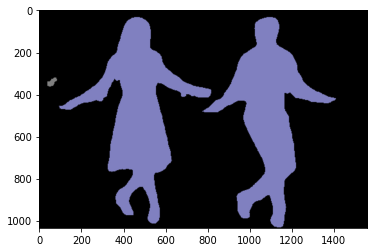

In [144]:
#segmentAsPascalvoc() 함수 를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
plt.imshow(output)
plt.show()

In [145]:
segvalues # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 배열값을 출력

{'class_ids': array([ 0,  7, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [146]:
#segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
car
person


In [147]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!

#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [148]:
colormap[15] #컬러맵 15에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 15번째인 사람)

array([192, 128, 128])

In [149]:
seg_color = (128,128,192) # 색상순서 변경 - colormap의 배열은 RGB 순이며 output의 배열은 BGR 순서로 채널 배치가 되어 있어서

(1034, 1560)


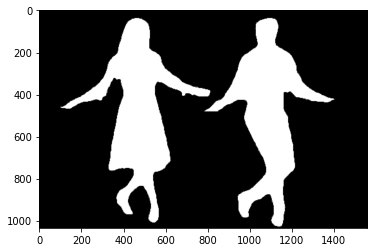

In [150]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

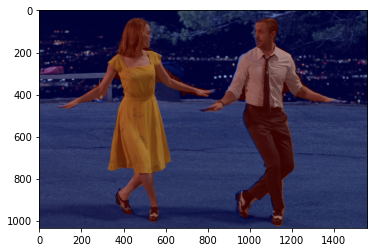

In [151]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

## 셸로우 포커스 만들기 (4) 배경 흐리게 하기

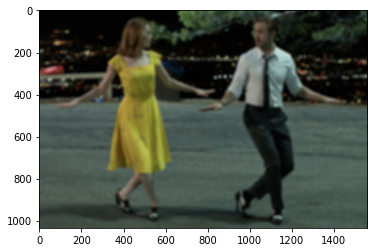

In [152]:
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (17,17)) #13->17 ....13정도는 크게 뭉개지지 않지만 블러효과를 극대화하고, 실험을 위해서 

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)   
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show() 

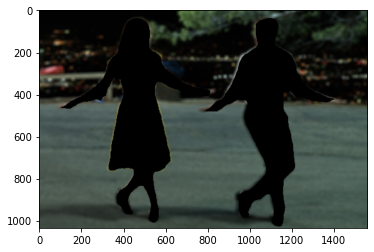

In [153]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_color)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

## 셸로우 포커스 만들기 (5) 흐린 배경과 원본 영상 합성

In [154]:
# # Q. 이번에는 사람 부분을 블러로, 배경 부분을 원본으로 출력해볼까요?
# # 힌트 : img_mask_color 옵션을 적절히 조정해주고, img_orig, img_orig_blur 를 활용하세요.
# img_show = img_orig.copy()
# img_concat = np.where(img_mask_color==255, img_orig_blur, img_show)
# plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
# plt.show() 

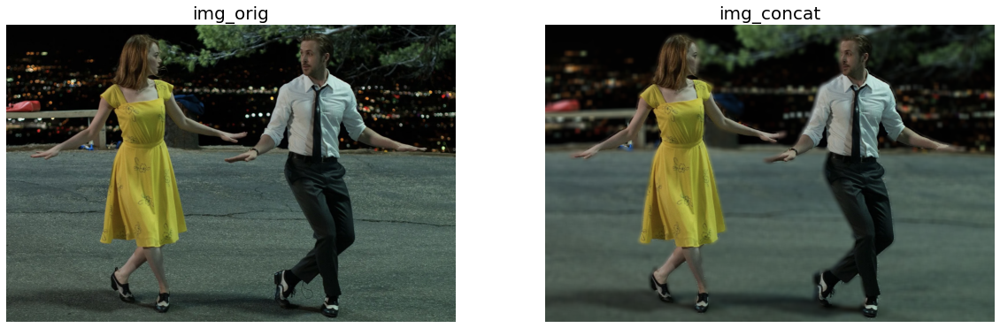

In [155]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)


import matplotlib.pyplot as plt
import cv2

# 이미지 로드 (img_orig와 img_concat은 이미 로드된 상태라고 가정)
# img_orig = cv2.imread('path_to_img_orig.jpg')
# img_concat = cv2.imread('path_to_img_concat.jpg')

# 이미지 표시를 위한 subplot 설정
fig, ax = plt.subplots(1, 2, figsize=(20, 15))  # 1행 2열, 전체 크기는 10x5

img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

# 첫 번째 이미지 표시
ax[0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
ax[0].set_title('img_orig')  # 첫 번째 이미지의 제목
ax[0].axis('off')  # 축 눈금 제거

# 두 번째 이미지 표시
ax[1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
ax[1].set_title('img_concat')  # 두 번째 이미지의 제목
ax[1].axis('off')  # 축 눈금 제거

# 이미지 표시
plt.show()


# 이미지 편하게 출력해보자

In [156]:
# seg_color 반환 함수
def get_colormap(label_name):
    # 아래 코드를 이해하지 않아도 좋습니다
    # PixelLib에서 그대로 가져온 코드입니다
    # 주목해야 할 것은 생상 코드 결과물이예요!
    colormap = np.zeros((256, 3), dtype = int)
    ind = np.arange(256, dtype=int)

    for shift in reversed(range(8)):
        for channel in range(3):
            colormap[:, channel] |= ((ind >> channel) & 1) << shift
        ind >>= 3

    # colormap[:20]

    index = LABEL_NAMES.index(label_name)  # 데이터 라벨 인덱스
    seg_color = colormap[index].tolist()  # BGR
    seg_color = seg_color[::-1]  # BGR2RGB
    return seg_color  # RGB

matplotlib 크기 줄이는 방법

plt.figure(figsize=(w,h))
이미지 그리기 전 설정
default_figsize = (6.4, 4.8)
fig.set_size_inches(w,h)
이미지 그려진 후 설정
plt.rcParams["figure.figsize"] = (w,h)

In [157]:
# 이미지 1개 그리기
def draw_img(img, img_title='', cmap=None):
    print(img.shape)

    # plt.figure(figsize=(12,12))
    plt.imshow(img, cmap)
    plt.title(img_title)
    plt.rc('axes', titlesize=20)
    plt.axis('off')

    plt.show()

In [158]:
# 이미지 2개 그리기
def draw_imgs(img_1, img_2, img_1_title='', img_2_title=''):
    plt.figure(figsize=(12,8))

    plt.subplot(211)
    plt.imshow(img_1)
    plt.title(img_1_title)
    plt.rc('axes', titlesize=20)
    plt.axis('off')

    plt.subplot(212)
    plt.imshow(img_2)
    plt.title(img_2_title)
    plt.rc('axes', titlesize=20)
    plt.axis('off')

    plt.show()

## 크로마키 기법 적용해 보기


In [159]:
import matplotlib.pyplot as plt
import cv2
import os

CAT_IMG_PATH = os.getenv('HOME')+'/aiffel/human_segmentation/images/cat.jpg'   
CAT_IMG_ORIG = cv2.imread(CAT_IMG_PATH) 

(853, 1280, 3)


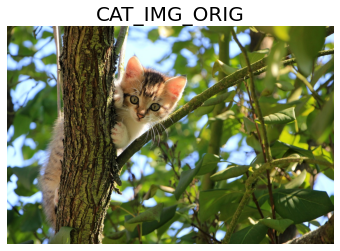

In [81]:
draw_img(cv2.cvtColor(CAT_IMG_ORIG, cv2.COLOR_BGR2RGB), 'CAT_IMG_ORIG')

In [82]:
# 모델에 이미지 입력
CAT_SEGVALUES, CAT_OUTPUT = model.segmentAsPascalvoc(CAT_IMG_PATH)

In [83]:
# 영역 검출된 클래스 출력
for class_id in CAT_SEGVALUES['class_ids']:
    print(LABEL_NAMES[class_id])

background
cat


(853, 1280, 3)


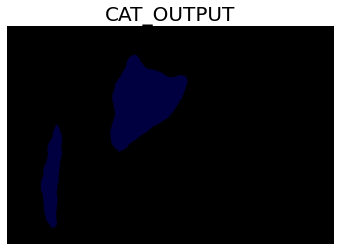

In [84]:
# 모델 출력값 확인
draw_img(CAT_OUTPUT, 'CAT_OUTPUT')

(853, 1280)


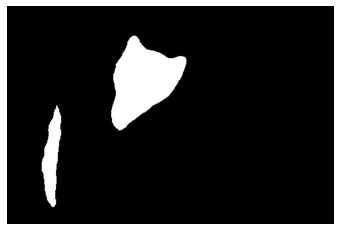

In [85]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_color = get_colormap('cat')
cat_seg_map = np.all(CAT_OUTPUT==seg_color, axis=-1)

draw_img(cat_seg_map, cmap='gray')

(853, 1280, 3)


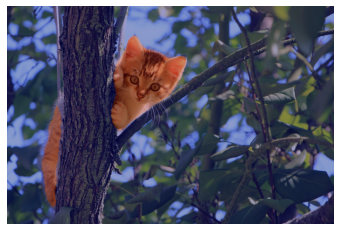

In [86]:
cat_img_show = CAT_IMG_ORIG.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
cat_img_mask = cat_seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
cat_color_mask = cv2.applyColorMap(cat_img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
cat_img_show = cv2.addWeighted(cat_img_show, 0.6, cat_color_mask, 0.4, 0.0)

draw_img(cv2.cvtColor(cat_img_show, cv2.COLOR_BGR2RGB))

(853, 1280, 3)


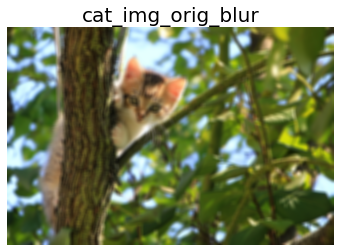

In [87]:
# blurring kernel size = (17,17)
cat_img_orig_blur = cv2.blur(CAT_IMG_ORIG, (17,17))

draw_img(cv2.cvtColor(cat_img_orig_blur, cv2.COLOR_BGR2RGB), 'cat_img_orig_blur')

(853, 1280, 3)


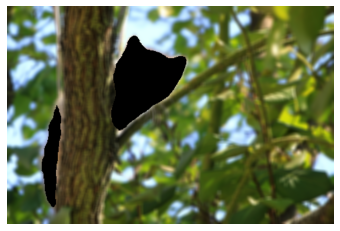

In [88]:
cat_img_mask_color = cv2.cvtColor(cat_img_mask, cv2.COLOR_GRAY2BGR)
cat_img_bg_mask = cv2.bitwise_not(cat_img_mask_color)
cat_img_bg_blur = cv2.bitwise_and(cat_img_orig_blur, cat_img_bg_mask)

draw_img(cv2.cvtColor(cat_img_bg_blur, cv2.COLOR_BGR2RGB))

(853, 1280, 3)


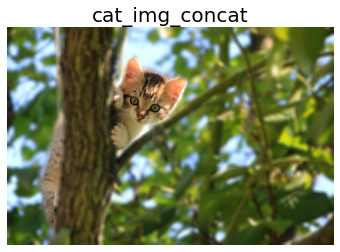

In [89]:
cat_img_concat = np.where(cat_img_mask_color==255, CAT_IMG_ORIG, cat_img_bg_blur)

draw_img(cv2.cvtColor(cat_img_concat, cv2.COLOR_BGR2RGB), 'cat_img_concat')

In [48]:
# import matplotlib.pyplot as plt
# import cv2
# import os

# CAT_IMG_DIR = os.getenv('HOME')+'/aiffel/human_segmentation/images/'
# CAT_IMG_ORIG = cv2.imread(PET_IMG_PATH) 

# # cf. plt.savefig() 는 plt.show() 직전에 해야 처리가 끝난 이미지 저장이 제대로 된다.
# # plt.savefig('image.png', bbox_inches='tight',pad_inches = 0) 로는 공백 및 테두리 숨기기가 제대로 안 됐기에 plt.imsave('image.png', img)를 사용함
# plt.imsave(CAT_IMG_DIR + "cat_blur.png", cv2.cvtColor(cat_img_concat, cv2.COLOR_BGR2RGB))

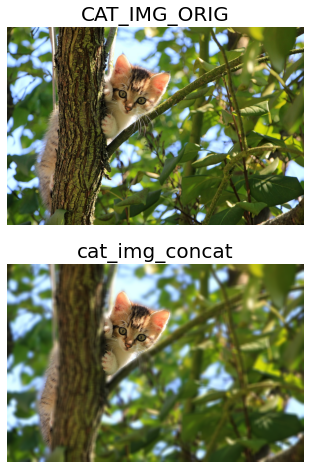

In [90]:
draw_imgs(cv2.cvtColor(CAT_IMG_ORIG, cv2.COLOR_BGR2RGB), cv2.cvtColor(cat_img_concat, cv2.COLOR_BGR2RGB), 'CAT_IMG_ORIG', 'cat_img_concat')

# 배경

In [91]:
BACK_IMG_PATH = os.getenv('HOME')+'/aiffel/human_segmentation/images/sunflower.jpg'   
BACK_IMG_ORIG = cv2.imread(BACK_IMG_PATH) 

(800, 1280, 3)


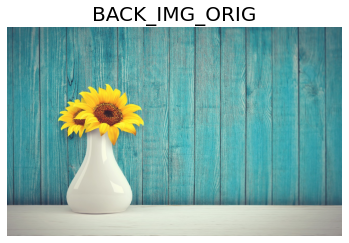

In [92]:
draw_img(cv2.cvtColor(BACK_IMG_ORIG, cv2.COLOR_BGR2RGB), 'BACK_IMG_ORIG')

In [93]:
# 고양이만 남기고 나머지는 0(검은색) 처리
cat_only_img_concat = np.where(cat_img_mask_color==255, CAT_IMG_ORIG, 0)

# 고양이 resize
h, w, c = cat_only_img_concat.shape
cat_img_resize = cv2.resize(cat_only_img_concat, (w//2, h//2), cv2.INTER_AREA)

(426, 640, 3)


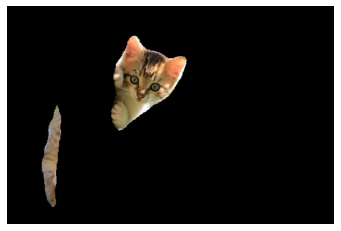

In [94]:
draw_img(cv2.cvtColor(cat_img_resize, cv2.COLOR_BGR2RGB))

In [96]:
back_img_show = BACK_IMG_ORIG.copy()

refined_y = 300
refined_x = 200

alpha = 0.2  # 투명도
sticker_area = back_img_show[refined_y:refined_y+cat_img_resize.shape[0], refined_x:refined_x+cat_img_resize.shape[1]]
back_img_show[refined_y:refined_y +cat_img_resize.shape[0], refined_x:refined_x+cat_img_resize.shape[1]] = \
cv2.addWeighted(sticker_area, alpha, np.where(cat_img_resize==0,sticker_area,cat_img_resize).astype(np.uint8), 1-alpha, 0)  # 컬러 값 0(검은색)

## 짠! 드디어 귀여운 야옹이님 등장!!

(800, 1280, 3)


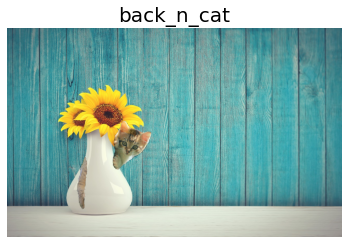

In [97]:
draw_img(cv2.cvtColor(back_img_show, cv2.COLOR_BGR2RGB), 'back_n_cat')

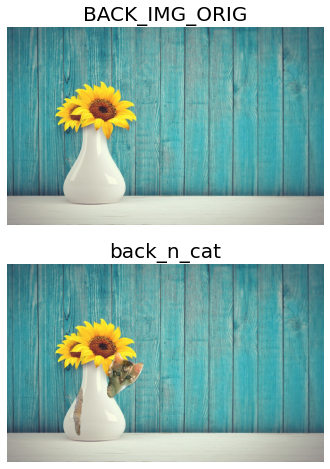

In [98]:
draw_imgs(cv2.cvtColor(BACK_IMG_ORIG, cv2.COLOR_BGR2RGB), cv2.cvtColor(back_img_show, cv2.COLOR_BGR2RGB), 'BACK_IMG_ORIG', 'back_n_cat')

(800, 1280, 3)
(2400, 3840, 3)


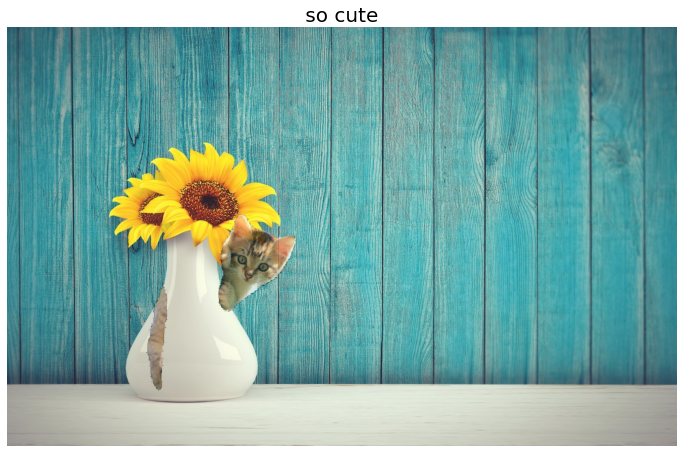

In [167]:
import cv2
import matplotlib.pyplot as plt

def draw_img(img, img_title='', cmap=None):
    print(img.shape)

    # 이미지의 크기를 3배로 조정
    height, width = img.shape[:2]
    resized_img = cv2.resize(img, (width * 3, height * 3))

    # 변경된 이미지 크기 출력
    print(resized_img.shape)

    # 이미지 출력
    plt.figure(figsize=(12,12))
    plt.imshow(resized_img, cmap)
    plt.title(img_title)
    plt.rc('axes', titlesize=20)
    plt.axis('off')

    plt.show()

draw_img(cv2.cvtColor(back_img_show, cv2.COLOR_BGR2RGB), ' so cute ')


## Step 2. 사진에서 문제점 찾기

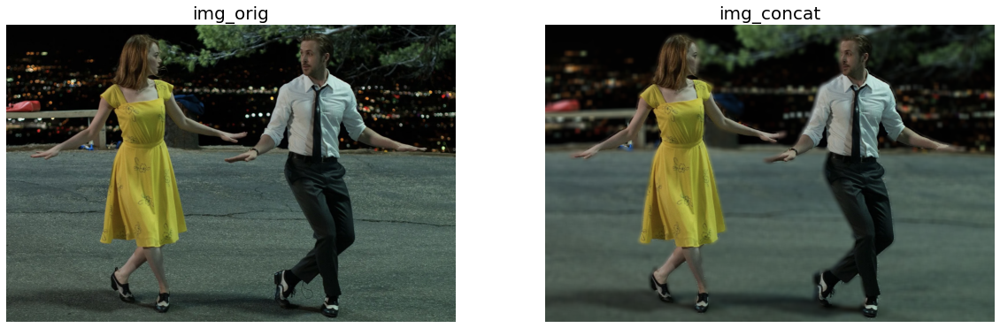

In [110]:


import matplotlib.pyplot as plt
import cv2

# 이미지 로드 (img_orig와 img_concat은 이미 로드된 상태라고 가정)
# img_orig = cv2.imread('path_to_img_orig.jpg')
# img_concat = cv2.imread('path_to_img_concat.jpg')

# 이미지 표시를 위한 subplot 설정
fig, ax = plt.subplots(1, 2, figsize=(20, 15))  # 1행 2열, 전체 크기는 10x5

img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

# 첫 번째 이미지 표시
ax[0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
ax[0].set_title('img_orig')  # 첫 번째 이미지의 제목
ax[0].axis('off')  # 축 눈금 제거

# 두 번째 이미지 표시
ax[1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
ax[1].set_title('img_concat')  # 두 번째 이미지의 제목
ax[1].axis('off')  # 축 눈금 제거

# 이미지 표시
plt.show()


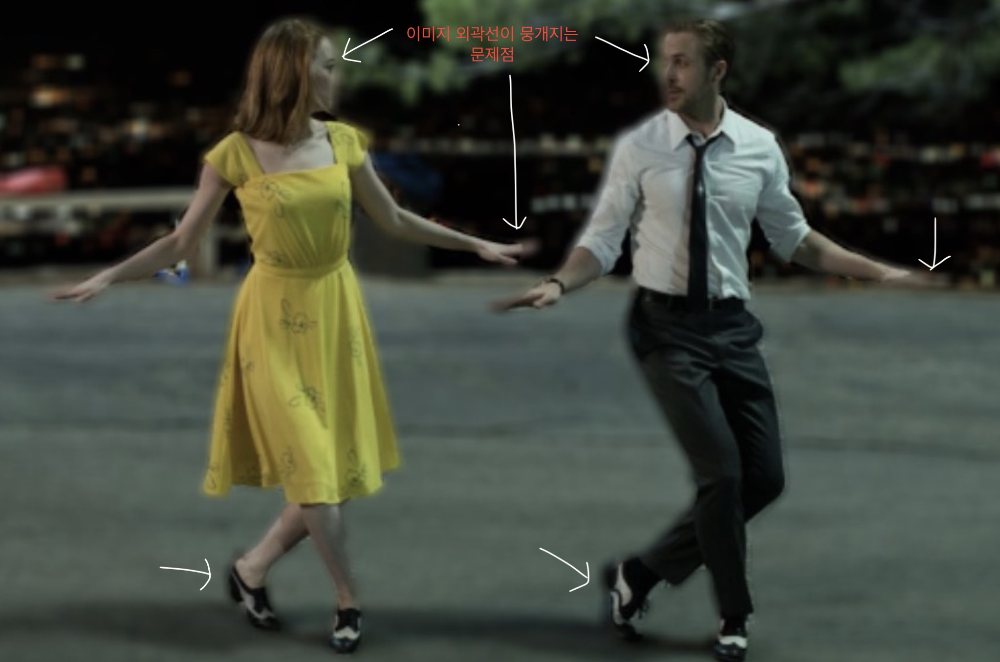

In [2]:
from IPython.display import Image
import os

url = os.getenv('HOME')+'/aiffel/human_segmentation/images/lala_land_p.jpg' 
Image(url)

## Step 3. 해결 방법을 제안해 보기

인물모드 사진의 문제점을 해결할 방안 제시하기

단순히 'XXX 기술을 사용한다.' 정도의 선언적 솔루션이 아니라, 여러분들이 선택한 기술이 DeepLab 모델의 Semantic Segmentation 이 만들어 낸 Mask 영역에 어떻게 적용되어 문제점을 보완하게 되는지의 메커니즘이 포함된 솔루션이어야 합니다.

### My Solution

Portrait의 경계선이 뭉개지지 않고 자연스럽게 보이게 할 수 있는 모델이나 방법을 찾고 적용해 보자.

#### 시도

엣지 검출 전 샤프닝 적용
엣지 검출 위해 캐니엣지 적용: cv2.Canny
블러링 함수로 cv2.blur() 대신 배경 제거 함수로 cv2.bgsegm.createBackgroundSubtractorMOG(history, nmixtures, backgroundRatio, noiseSigma) 사용해 보았는데 동일한 블러 매개변수 17로 지정했는데 조금은 개선이 된 듯함.

이에 다른 모델 찾기에 나서 MODNet을 찾았고 이 모델은 백그라운드 제거와 인물 검출 성능이 탁월한 모델인 것 같은데 배경지식을 알아가고 모델적용 단계 부분에서 실력과 능력이 미치지 못하여 완벽한 적용하지 못함. 차후 시도해 볼 가치가 있다고 판단됨.


#### 엣지 검출 전 샤프닝 적용

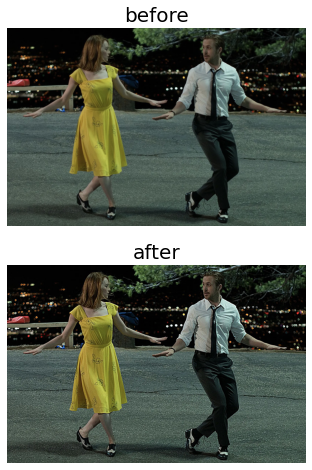

In [133]:
# 언샤프 마스크 필터링 https://deep-learning-study.tistory.com/155
import os
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/lala_land.jpg'  
img_orig = cv2.imread(img_path)

img = cv2.imread(img_path, cv2.COLOR_BGR2GRAY)
blr = cv2.GaussianBlur(img, (0, 0), 2) # 표준편차 2, 필터 크기는 자동 설정

a = 2.0 # 샤프닝 정도 결정하는 변수
dst = np.clip((1+a)*img - a * blr, 0, 255).astype(np.uint8) # 계산은 정수, 출력은 실수

draw_imgs(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB), cv2.cvtColor(dst, cv2.COLOR_BGR2RGB), 'before', 'after')

plt.imsave(os.getenv('HOME')+'/aiffel/human_segmentation/images/_sharpening.jpg', cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

#### 엣지 검출 좀 더 정확히 해보기

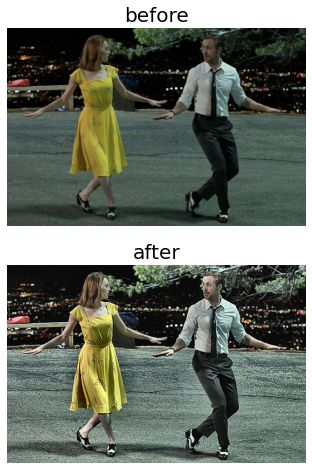

In [126]:
# 이미지 대조 색상 강조하기 https://ansan-survivor.tistory.com/311

''' 함수) 이미지를 더 선명하게 Contrast(대조) 기법을 적용시킴.
param : 컬러 이미지
return : 대조된 이미지
'''

def img_Contrast(img):
    # -----Converting image to LAB Color model-----------------------------------
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    
    # -----Splitting the LAB image to different channels-------------------------
    l, a, b = cv2.split(lab)
    
    # -----Applying CLAHE to L-channel-------------------------------------------
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    
    # -----Merge the CLAHE enhanced L-channel with the a and b channel-----------
    limg = cv2.merge((cl, a, b))
    
    # -----Converting image from LAB Color model to RGB model--------------------
    final = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return final

img = cv2.imread(os.getenv('HOME')+'/aiffel/human_segmentation/images/_sharpening.png', cv2.COLOR_BGR2GRAY)
img = img_Contrast(img)

draw_imgs(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB), cv2.cvtColor(img, cv2.COLOR_BGR2RGB), 'before', 'after')

plt.imsave(os.getenv('HOME')+'/aiffel/human_segmentation/images/_sharpening.png', cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

#### 보행자 검출을 위한 HOG
영상에서 사람을 검출하는 코드인데 역시 효과없음.

[[373   0 139 277]]
(1034, 1560, 3)


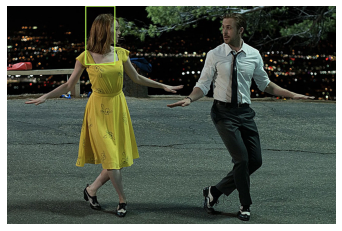

In [163]:
import random
import sys

# 동영상 불러오기
img = cv2.imread(os.getenv('HOME')+'/aiffel/human_segmentation/images/lala_land.jpg', cv2.COLOR_BGR2RGB)
img = dst.copy()

# 보행자 검출을 위한 HOG 기술자 설정
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# 매 프레임마다 보행자 검출
detected, _ = hog.detectMultiScale(img) # 사각형 정보를 받아옴
print(detected)

# 검출 결과 화면 표시
for (x, y, w, h) in detected:
    c = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    cv2.rectangle(img, (x, y, w, h), c, 3)

#####
draw_img(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imsave(os.getenv('HOME')+'/aiffel/human_segmentation/images/lala_land_HOG.jpg', cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

#### 엣지 검출

(1034, 1560, 3)
(3102, 4680, 3)


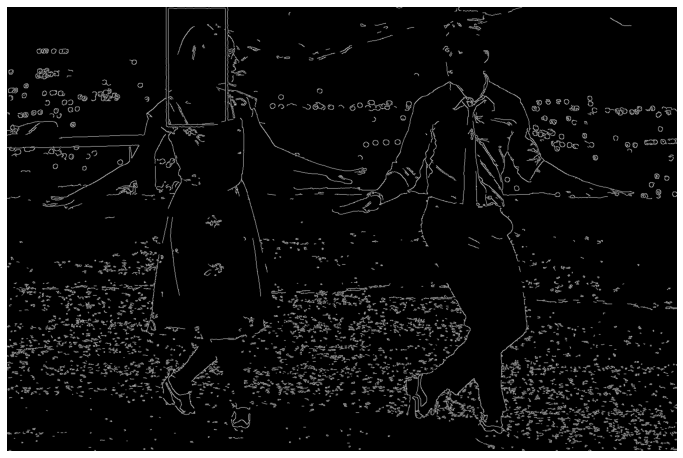

In [132]:
# 캐니 # 캐니 엣지 적용
edged = cv2.Canny(img, 300, 600)  # 하단 임계값과 상단 임계값은 실험적으로 결정하기

draw_img(cv2.cvtColor(edged, cv2.COLOR_BGR2RGB))

plt.imsave(os.getenv('HOME')+'/aiffel/human_segmentation/images/_canny_edge.jpg', cv2.cvtColor(edged, cv2.COLOR_BGR2RGB))

블러링 함수로 cv2.blur() 대신 
cv2.GaussianBlur()
cv2.MedianBlur()
기존 cv2.blur() 함수에 비해 딱히 효과 없는 것 같음

background
car
person
(1034, 1560, 3)
(3102, 4680, 3)


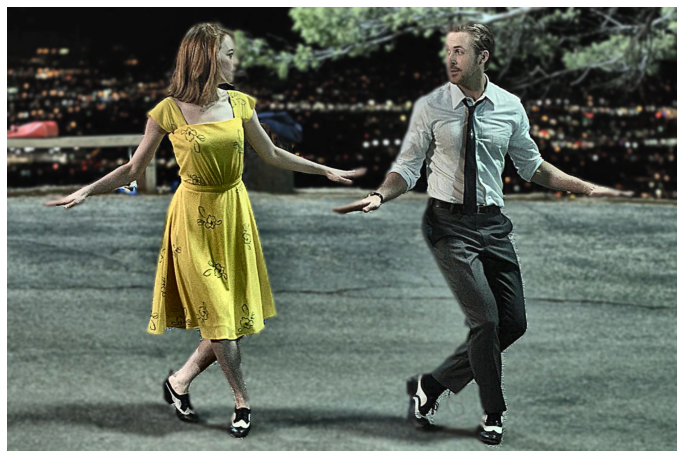

In [172]:
# 이미지 불러오기
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/_sharpening.jpg'
img = cv2.imread(img_path, cv2.COLOR_BGR2GRAY)
img = img_Contrast(img)


# DeepLab 모델에 이미지 입력 후 출력
person_2_segvalues, person_2_output = model.segmentAsPascalvoc(img_path)
for class_id in person_2_segvalues['class_ids']:
    print(LABEL_NAMES[class_id])
# draw_img(cv2.cvtColor(person_2_output, cv2.COLOR_BGR2RGB), 'person_2_output')


# seg_color로만 이루어진 마스크 생성
seg_color = get_colormap('person')
person_2_seg_map = np.all(person_2_output==seg_color, axis=-1)


# True와 Flase인 값을 각각 255와 0으로 변경
person_2_img_mask = person_2_seg_map.astype(np.uint8) * 255


# 이미지 블러링
# person_2_img_orig_blur = cv2.medianBlur(img, 21)
person_2_img_orig_blur = cv2.GaussianBlur(img, (17,17), 0)


# 세그멘테이션 마스크를 이용하여 배경만 추출
person_2_img_mask_color = cv2.cvtColor(person_2_img_mask, cv2.COLOR_GRAY2BGR)
person_2_img_bg_mask = cv2.bitwise_not(person_2_img_mask_color)
person_2_img_bg_blur = cv2.bitwise_and(person_2_img_orig_blur, person_2_img_bg_mask)
# draw_img(cv2.cvtColor(person_2_img_bg_blur, cv2.COLOR_BGR2RGB))


# 배경 이미지와 사람 이미지 합치기
person_2_img_concat = np.where(person_2_img_mask_color==255, img, person_2_img_bg_blur)
draw_img(cv2.cvtColor(person_2_img_concat, cv2.COLOR_BGR2RGB))


# 이미지 처리 결과 저장
plt.imsave(os.getenv('HOME')+'/aiffel/human_segmentation/images/lala_land_gaussian_blur.jpg', cv2.cvtColor(person_2_img_concat, cv2.COLOR_BGR2RGB))


####  결과비교

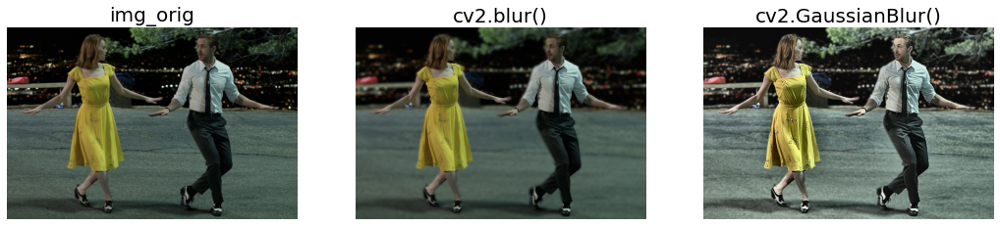

In [173]:
plt.figure(figsize=(18,12))

plt.subplot(131)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.title('img_orig')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.title('cv2.blur()')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(person_2_img_concat, cv2.COLOR_BGR2RGB))
plt.title('cv2.GaussianBlur()')
plt.rc('axes', titlesize=20)
plt.axis('off')

plt.show()

### MODNet 모델 적용 해보기

In [33]:
import os
# clone the repository
%cd /aiffel/aiffel/human_segmentation
if not os.path.exists('MODNet'):
  !git clone https://github.com/ZHKKKe/MODNet
%cd MODNet/

# dowload the pre-trained ckpt for image matting
pretrained_ckpt = 'pretrained/modnet_photographic_portrait_matting.ckpt'
if not os.path.exists(pretrained_ckpt):
  !gdown --id 1mcr7ALciuAsHCpLnrtG_eop5-EYhbCmz \
          -O pretrained/modnet_photographic_portrait_matting.ckpt

/aiffel/aiffel/human_segmentation
/aiffel/aiffel/human_segmentation/MODNet
/bin/bash: gdown: command not found


In [116]:
# import shutil
# import os
# # from google.colab import files

# # clean and rebuild the image folders
# input_folder = 'os.getenv('HOME')+'/aiffel/human_segmentation/MODNet/demo/image_matting/colab/input'
# if os.path.exists(input_folder):
#   shutil.rmtree(input_folder)
# os.makedirs(input_folder)

# output_folder = os.getenv('HOME')+'/aiffel/human_segmentation/MODNet/demo/image_matting/colab/output'
# if os.path.exists(output_folder):
#   shutil.rmtree(output_folder)
# os.makedirs(output_folder)

# # upload images (PNG or JPG)
# image_names = list(files.upload().keys())
# for image_name in image_names:
#   shutil.move(image_name, os.path.join(input_folder, image_name))

SyntaxError: invalid syntax (3632441199.py, line 6)

In [117]:
!python -m demo.image_matting.colab.inference \
        --input-path demo/image_matting/colab/input \
        --output-path demo/image_matting/colab/output \
        --ckpt-path ./pretrained/modnet_photographic_portrait_matting.ckpt


Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/runpy.py", line 197, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "/opt/conda/lib/python3.9/runpy.py", line 87, in _run_code
    exec(code, run_globals)
  File "/aiffel/aiffel/human_segmentation/MODNet/demo/image_matting/colab/inference.py", line 7, in <module>
    import torch
  File "/opt/conda/lib/python3.9/site-packages/torch/__init__.py", line 197, in <module>
    from torch._C import *  # noqa: F403
ImportError: libtinfo.so.5: cannot open shared object file: No such file or directory


In [118]:
import numpy as np
from PIL import Image
from matplotlib import pyplot as plt
import cv2

def combined_display(image, matte):
  # calculate display resolution
  w, h = image.width, image.height
  rw, rh = 800, int(h * 800 / (3 * w))
  
  # obtain predicted foreground
  image = np.asarray(image)
  if len(image.shape) == 2:
    image = image[:, :, None]
  if image.shape[2] == 1:
    image = np.repeat(image, 3, axis=2)
  elif image.shape[2] == 4:
    image = image[:, :, 0:3]
  matte = np.repeat(np.asarray(matte)[:, :, None], 3, axis=2) / 255
  foreground = image * matte + np.full(image.shape, 255) * (1 - matte)
  
  # combine image, foreground, and alpha into one line
  combined = np.concatenate((image, foreground, matte * 255), axis=1)
  combined = Image.fromarray(np.uint8(combined)).resize((rw, rh))
  return combined

# visualize all images
image_names = os.listdir(input_folder)
for image_name in image_names:
  matte_name = image_name.split('.')[0] + '.jpg'
  image = Image.open(os.path.join(input_folder, image_name))
  matte = Image.open(os.path.join(output_folder, matte_name))
  display(combined_display(image, matte))
  print(image_name, '\n')

ValueError: operands could not be broadcast together with shapes (1034,1560,3) (1034,1560,3,3) 

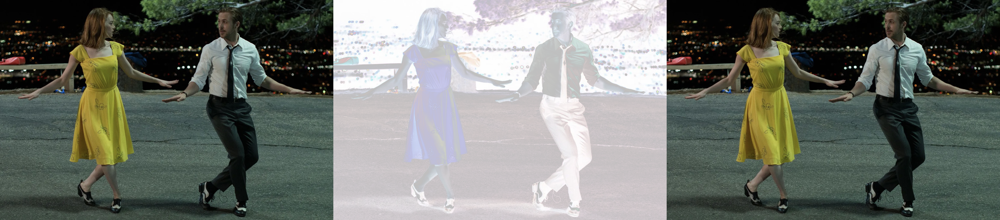

lala_land.jpg


ValueError: operands could not be broadcast together with shapes (1034,1560,3) (1034,1560,3,3) 

In [120]:
import numpy as np
from PIL import Image
import os

def combined_display(image, matte):
    # 이미지와 마스크를 NumPy 배열로 변환
    image_np = np.asarray(image)
    matte_np = np.asarray(matte)

    # 마스크의 채널 수 확인 및 조정
    if len(matte_np.shape) == 2:  # 그레이스케일인 경우
        matte_np = matte_np[:, :, None]
    elif matte_np.shape[2] > 3:  # 3개 이상의 채널을 가진 경우 (예: RGBA)
        matte_np = matte_np[:, :, :3]
    matte_np = matte_np / 255

    # 전경 계산
    foreground = image_np * matte_np + np.full(image_np.shape, 255) * (1 - matte_np)

    # 이미지, 전경, 알파 채널을 결합
    combined = np.concatenate((image_np, foreground, matte_np * 255), axis=1)
    combined = Image.fromarray(np.uint8(combined))

    return combined

input_folder = os.getenv('HOME')+'/aiffel/human_segmentation/MODNet/demo/image_matting/colab/input'
output_folder = os.getenv('HOME')+'/aiffel/human_segmentation/MODNet/demo/image_matting/colab/output'

# 모든 이미지를 시각화
image_names = os.listdir(input_folder)
for image_name in image_names:
    matte_name = image_name.split('.')[0] + '.jpg'
    image = Image.open(os.path.join(input_folder, image_name))
    matte = Image.open(os.path.join(output_folder, matte_name))
    
    combined = combined_display(image, matte)
    combined.show()
    print(image_name)

    
    import numpy as np
from PIL import Image
from matplotlib import pyplot as plt
import cv2

def combined_display(image, matte):
  # calculate display resolution
  w, h = image.width, image.height
  rw, rh = 800, int(h * 800 / (3 * w))
  
  # obtain predicted foreground
  image = np.asarray(image)
  if len(image.shape) == 2:
    image = image[:, :, None]
  if image.shape[2] == 1:
    image = np.repeat(image, 3, axis=2)
  elif image.shape[2] == 4:
    image = image[:, :, 0:3]
  matte = np.repeat(np.asarray(matte)[:, :, None], 3, axis=2) / 255
  foreground = image * matte + np.full(image.shape, 255) * (1 - matte)
  
  # combine image, foreground, and alpha into one line
  combined = np.concatenate((image, foreground, matte * 255), axis=1)
  combined = Image.fromarray(np.uint8(combined)).resize((rw, rh))
  return combined

# visualize all images
image_names = os.listdir(input_folder)
for image_name in image_names:
  matte_name = image_name.split('.')[0] + '.jpg'
  image = Image.open(os.path.join(input_folder, image_name))
  matte = Image.open(os.path.join(output_folder, matte_name))
  display(combined_display(image, matte))
  print(image_name, '\n')

In [121]:
import numpy as np
from PIL import Image
import os

def combined_display(image, matte):
    # 이미지와 마스크를 NumPy 배열로 변환
    image_np = np.array(image.convert("RGB"))
    matte_np = np.array(matte)

    # 마스크의 채널 수 확인 및 조정
    if matte_np.ndim == 2:  # 그레이스케일인 경우
        matte_np = matte_np[:, :, None]
    if matte_np.shape[2] == 4:  # 4채널인 경우 (예: RGBA)
        matte_np = matte_np[:, :, 3:4]  # 알파 채널만 사용
    elif matte_np.shape[2] > 3:  # 3채널 초과인 경우
        matte_np = matte_np[:, :, :3]  # 처음 3채널만 사용
    matte_np = matte_np / 255  # 정규화

    # 전경 계산
    foreground = image_np * matte_np
    foreground = np.clip(foreground, 0, 255)  # 값을 0과 255 사이로 제한

    # 배경을 흰색으로 설정
    background = np.ones_like(image_np) * 255

    # 이미지, 전경, 알파 채널을 결합
    combined = np.concatenate((image_np, foreground.astype(np.uint8), matte_np * 255), axis=1)
    combined = Image.fromarray(np.uint8(combined))

    return combined

# 입력 폴더와 출력 폴더 경로 설정
input_folder = os.getenv('HOME')+'/aiffel/human_segmentation/MODNet/demo/image_matting/colab/input'
output_folder = os.getenv('HOME')+'/aiffel/human_segmentation/MODNet/demo/image_matting/colab/output'

# 모든 이미지를 시각화
image_names = [name for name in os.listdir(input_folder) if not name.startswith('.')]
for image_name in image_names:
    matte_name = image_name.split('.')[0] + '.png'  # 마스크 파일의 확장자가 .png인 경우
    image_path = os.path.join(input_folder, image_name)
    matte_path = os.path.join(output_folder, matte_name)
    
    # 이미지와 마스크가 둘 다 존재하는 경우에만 처리
    if os.path.exists(image_path) and os.path.exists(matte_path):
        image = Image.open(image_path)
        matte = Image.open(matte_path)
        combined = combined_display(image, matte)
        combined.show()
        print(image_name)
    else:
        print(f"Image or matte not found for {image_name}")


Image or matte not found for lala_land.jpg
